# Forecasting Traffic Flow in densely populated areas using Neural Networks

### Libraries

In [1]:
# Data Collection
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import warnings

# Data Cleaning
from sklearn.impute import KNNImputer
from sklearn.ensemble import RandomForestRegressor
# Normalazation
from sklearn.preprocessing import MinMaxScaler, OneHotEncoder
# Feature Selection
import seaborn as sns
# PCA
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import VarianceThreshold

# Model Training
from sklearn.model_selection import TimeSeriesSplit
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_absolute_error, mean_squared_error



## Phase 1 - Data Collection: 1 hour Interval

In [49]:
df = pd.read_csv('3_WOEF_Data.csv')
df.isnull().sum()  
df.head()

,DateTime,vehicle_count_per_hour,average_speed_per_hour,PH Bool,Day,Time
0,01/08/2023 00:00,78.0,77.0,0,01/08/2023,00:00:00
1,01/08/2023 01:00,54.0,85.0,0,01/08/2023,01:00:00
2,01/08/2023 02:00,44.0,82.0,0,01/08/2023,02:00:00
3,01/08/2023 03:00,42.0,79.0,0,01/08/2023,03:00:00
4,01/08/2023 04:00,56.0,82.0,0,01/08/2023,04:00:00


## Phase 2 - Preprocessing

### Data Cleaning

#### Remove unnecessary data fields

In [50]:
df['DateTime'] = pd.to_datetime(df['DateTime'], format='%d/%m/%Y %H:%M') 

df['hour_of_day'] = df['DateTime'].dt.hour
df['day_of_week'] = df['DateTime'].dt.dayofweek
df['month'] = df['DateTime'].dt.month
df['day_of_year'] = df['DateTime'].dt.day_of_year


# Convert 'Day' column to datetime
df['Day'] = pd.to_datetime(df['Day'], format='%d/%m/%Y')

# Extract the day of the week, where Monday=1, ..., Sunday=7
df['day_of_week'] = df['Day'].dt.dayofweek + 1

In [51]:
#df = df.drop('PH', axis=1)
#df = df.drop('icon', axis=1)
df = df.drop('Day', axis=1) # For weather column
df = df.drop('Time', axis=1)
#df = df.drop('datetimeEpoch', axis=1)

df.head()

,DateTime,vehicle_count_per_hour,average_speed_per_hour,PH Bool,hour_of_day,day_of_week,month,day_of_year
0,2023-08-01 00:00:00,78.0,77.0,0,0,2,8,213
1,2023-08-01 01:00:00,54.0,85.0,0,1,2,8,213
2,2023-08-01 02:00:00,44.0,82.0,0,2,2,8,213
3,2023-08-01 03:00:00,42.0,79.0,0,3,2,8,213
4,2023-08-01 04:00:00,56.0,82.0,0,4,2,8,213


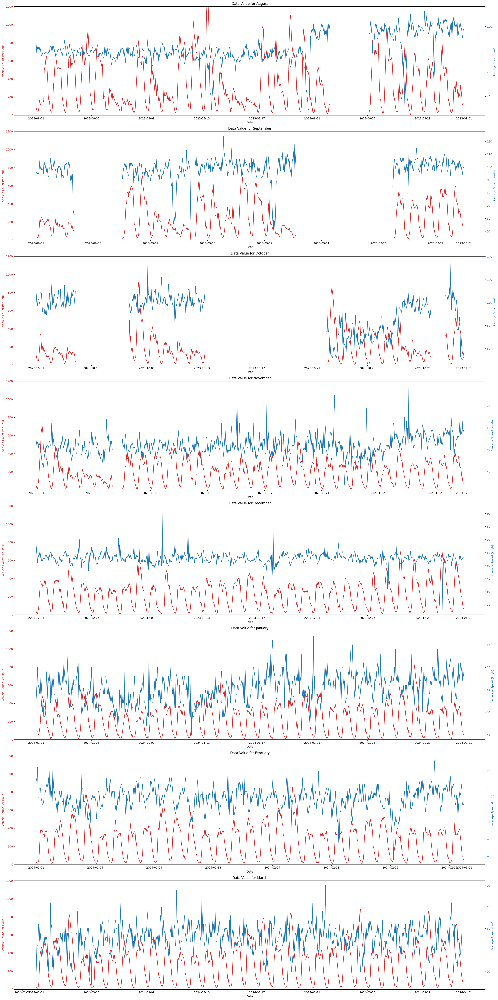

In [52]:
# Set up the figure size and layout
plt.figure(figsize=(25, 50))

# Names of the months for labeling purposes
month_names = ['August', 'September', 'October', 'November', 'December', 'January', 'February', 'March']

# Indices of the months you want to plot (exclude March to July)
months_to_plot = [8, 9, 10, 11, 12, 1, 2, 3]

for i, month in enumerate(months_to_plot, start=1):
    ax1 = plt.subplot(8, 1, i)  # Create a subplot for each month and get the first axis
    
    # Filter data for the current month
    month_data = df[df['month'] == month]
    
    # Plotting vehicle count per hour on the primary y-axis
    color = 'tab:red'
    ax1.set_xlabel('Date')
    ax1.set_ylabel('Vehicle Count Per Hour', color=color)
    ax1.plot(month_data['DateTime'], month_data['vehicle_count_per_hour'], color=color)
    ax1.tick_params(axis='y', labelcolor=color)
    ax1.set_ylim([0, 1200])  # Adjust y-axis to always have a max of 1200 for vehicle count
    
    # Create a second y-axis for the average speed
    ax2 = ax1.twinx()  
    color = 'tab:blue'
    ax2.set_ylabel('Average Speed (km/h)', color=color)  # we already handled the x-label with ax1
    ax2.plot(month_data['DateTime'], month_data['average_speed_per_hour'], color=color)
    ax2.tick_params(axis='y', labelcolor=color)
    # Optionally, set a limit for the average speed axis
    # ax2.set_ylim([0, max_speed_limit])

    plt.title(f'Data Value for {month_names[i-1]}')
    plt.xticks(rotation=45)  # Rotate date labels for better readability
    plt.tight_layout()  # Adjust subplots to fit in the figure area

plt.show()

#### Handling missing Data

#### Using KNN

In [53]:
# Create the imputer object. You can adjust 'n_neighbors' as appropriate for your data.
knn_imputer = KNNImputer(n_neighbors=5, weights='uniform')

# Prepare the data by selecting only the numeric columns that do not have missing values to be used as predictors
# and the ones with missing values that need to be imputed.
columns_for_imputation = ['vehicle_count_per_hour', 'average_speed_per_hour']
predictor_columns = df.select_dtypes(include=[np.number]).columns.drop(columns_for_imputation)

# Impute missing values using KNN
df_imputed = knn_imputer.fit_transform(df[predictor_columns.union(columns_for_imputation)])

# The output is a numpy array, so if you want it back in a DataFrame, ensure to keep the original index:
df_imputed = pd.DataFrame(df_imputed, columns=predictor_columns.union(columns_for_imputation), index=df.index)

# Now update the original DataFrame with the imputed values for the specified columns
df[columns_for_imputation] = df_imputed[columns_for_imputation]

# Check your DataFrame to make sure the missing data has been imputed
print(df[columns_for_imputation].head())

# Save the DataFrame to an Excel file
df.to_excel('3_Handling_Missing_Data_Pre-processing.xlsx', index=False)

   vehicle_count_per_hour  average_speed_per_hour
0                    78.0                    77.0
1                    54.0                    85.0
2                    44.0                    82.0
3                    42.0                    79.0
4                    56.0                    82.0


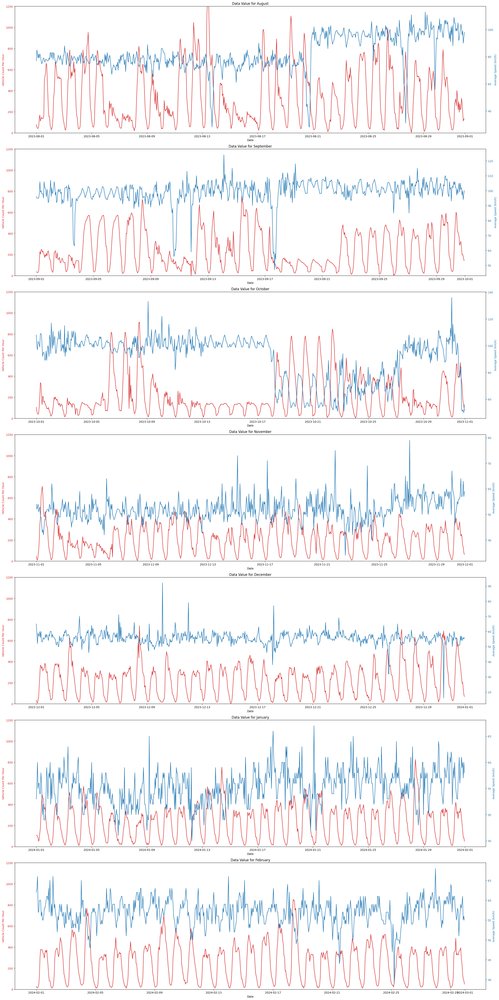

In [40]:
# Assuming the 'Month' column has already been added to df
df['Month'] = df['DateTime'].dt.month

# Set up the figure size and layout
plt.figure(figsize=(25, 50))

# Names of the months for labeling purposes
month_names = ['August', 'September', 'October', 'November', 'December', 'January', 'February']

# Indices of the months you want to plot (exclude March to July)
months_to_plot = [8, 9, 10, 11, 12, 1, 2]

for i, month in enumerate(months_to_plot, start=1):
    ax1 = plt.subplot(7, 1, i)  # Create a subplot for each month and get the first axis
    
    # Filter data for the current month
    month_data = df[df['Month'] == month]
    
    # Plotting vehicle count per hour on the primary y-axis
    color = 'tab:red'
    ax1.set_xlabel('Date')
    ax1.set_ylabel('Vehicle Count Per Hour', color=color)
    ax1.plot(month_data['DateTime'], month_data['vehicle_count_per_hour'], color=color)
    ax1.tick_params(axis='y', labelcolor=color)
    ax1.set_ylim([0, 1200])  # Adjust y-axis to always have a max of 1200 for vehicle count
    
    # Create a second y-axis for the average speed
    ax2 = ax1.twinx()  
    color = 'tab:blue'
    ax2.set_ylabel('Average Speed (km/h)', color=color)  # we already handled the x-label with ax1
    ax2.plot(month_data['DateTime'], month_data['average_speed_per_hour'], color=color)
    ax2.tick_params(axis='y', labelcolor=color)
    # Optionally, set a limit for the average speed axis
    # ax2.set_ylim([0, max_speed_limit])

    plt.title(f'Data Value for {month_names[i-1]}')
    plt.xticks(rotation=45)  # Rotate date labels for better readability
    plt.tight_layout()  # Adjust subplots to fit in the figure area

plt.show()


#### Not Using Random Forest

In [36]:
# Split the data based on missing 'vehicle_count_per_hour' or 'average_speed_per_hour'
df_not_missing_vc = df.dropna(subset=['vehicle_count_per_hour'])
df_missing_vc = df[df['vehicle_count_per_hour'].isna()]

df_not_missing_as = df.dropna(subset=['average_speed_per_hour'])
df_missing_as = df[df['average_speed_per_hour'].isna()]

# Assuming 'hour', 'day_of_week', and any other relevant features are your predictors

# For 'vehicle_count_per_hour'
X_vc = df_not_missing_vc[['hour_of_day', 'day_of_week']]  # Add more features as needed
y_vc = df_not_missing_vc['vehicle_count_per_hour']

model_vc = RandomForestRegressor(n_estimators=100)
model_vc.fit(X_vc, y_vc)

if not df_missing_vc.empty:
    X_missing_vc = df_missing_vc[['hour_of_day', 'day_of_week']]
    predicted_vc = model_vc.predict(X_missing_vc)
    df.loc[df['vehicle_count_per_hour'].isna(), 'vehicle_count_per_hour'] = predicted_vc

# For 'average_speed_per_hour'
X_as = df_not_missing_as[['hour_of_day', 'day_of_week']]  # Add more features as needed
y_as = df_not_missing_as['average_speed_per_hour']

model_as = RandomForestRegressor(n_estimators=100)
model_as.fit(X_as, y_as)

if not df_missing_as.empty:
    X_missing_as = df_missing_as[['hour_of_day', 'day_of_week']]
    predicted_as = model_as.predict(X_missing_as)
    df.loc[df['average_speed_per_hour'].isna(), 'average_speed_per_hour'] = predicted_as

# Check null values
print(df.isnull().sum())

# Save the DataFrame to an Excel file
df.to_excel('1_Handling_Missing_Data_Pre-processing.xlsx', index=False)


DateTime                     0
vehicle_count_per_hour       0
average_speed_per_hour       0
PH Bool                      0
temp                         0
feelslike                    0
humidity                     0
dew                          0
precip                       0
precipprob                   0
windgust                     0
windspeed                    0
winddir                      0
pressure                     0
visibility                 143
cloudcover                   0
solarradiation            2557
solarenergy               2557
uvindex                   2557
conditions                   0
hour_of_day                  0
day_of_week                  0
month                        0
day_of_year                  0
dtype: int64


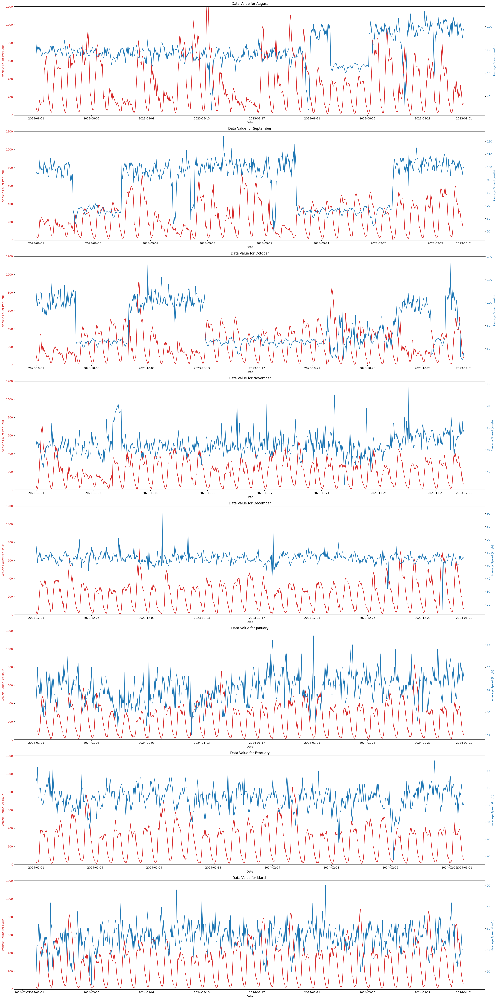

In [37]:
# Set up the figure size and layout
plt.figure(figsize=(25, 50))

# Names of the months for labeling purposes
month_names = ['August', 'September', 'October', 'November', 'December', 'January', 'February', 'March']

# Indices of the months you want to plot (exclude March to July)
months_to_plot = [8, 9, 10, 11, 12, 1, 2, 3]

for i, month in enumerate(months_to_plot, start=1):
    ax1 = plt.subplot(8, 1, i)  # Create a subplot for each month and get the first axis
    
    # Filter data for the current month
    month_data = df[df['month'] == month]
    
    # Plotting vehicle count per hour on the primary y-axis
    color = 'tab:red'
    ax1.set_xlabel('Date')
    ax1.set_ylabel('Vehicle Count Per Hour', color=color)
    ax1.plot(month_data['DateTime'], month_data['vehicle_count_per_hour'], color=color)
    ax1.tick_params(axis='y', labelcolor=color)
    ax1.set_ylim([0, 1200])  # Adjust y-axis to always have a max of 1200 for vehicle count
    
    # Create a second y-axis for the average speed
    ax2 = ax1.twinx()  
    color = 'tab:blue'
    ax2.set_ylabel('Average Speed (km/h)', color=color)  # we already handled the x-label with ax1
    ax2.plot(month_data['DateTime'], month_data['average_speed_per_hour'], color=color)
    ax2.tick_params(axis='y', labelcolor=color)
    # Optionally, set a limit for the average speed axis
    # ax2.set_ylim([0, max_speed_limit])

    plt.title(f'Data Value for {month_names[i-1]}')
    plt.xticks(rotation=45)  # Rotate date labels for better readability
    plt.tight_layout()  # Adjust subplots to fit in the figure area

plt.show()

### Normilization

In [55]:
# Using One-Hot Encoding and MinMaxScaler

# Identify Variable Types
numeric_columns = [
    'vehicle_count_per_hour', 'average_speed_per_hour'
]

# Normalize Numeric Variables
scaler = MinMaxScaler()
df[numeric_columns] = scaler.fit_transform(df[numeric_columns].fillna(0))

# Your dataset is now normalized and encoded
print(df.head())
df.head(150)
# Save the modified DataFrame to an Excel file
df.to_excel('4_Normalization.xlsx', index=False)


             DateTime  vehicle_count_per_hour  average_speed_per_hour  \
0 2023-08-01 00:00:00                0.059049                0.508333   
1 2023-08-01 01:00:00                0.040644                0.575000   
2 2023-08-01 02:00:00                0.032975                0.550000   
3 2023-08-01 03:00:00                0.031442                0.525000   
4 2023-08-01 04:00:00                0.042178                0.550000   

   PH Bool  hour_of_day  day_of_week  month  day_of_year  
0        0            0            2      8          213  
1        0            1            2      8          213  
2        0            2            2      8          213  
3        0            3            2      8          213  
4        0            4            2      8          213  


### Feature Selection

                        DateTime  vehicle_count_per_hour  \
DateTime                1.000000               -0.020918   
vehicle_count_per_hour -0.020918                1.000000   
average_speed_per_hour -0.672252               -0.074031   
PH Bool                 0.071842                0.015986   
hour_of_day             0.004095                0.212474   
day_of_week             0.017865                0.113984   
month                  -0.636858               -0.069897   
day_of_year            -0.626031               -0.067159   

                        average_speed_per_hour       PH Bool   hour_of_day  \
DateTime                             -0.672252  7.184184e-02  4.094802e-03   
vehicle_count_per_hour               -0.074031  1.598565e-02  2.124738e-01   
average_speed_per_hour                1.000000 -4.811028e-02 -3.763861e-02   
PH Bool                              -0.048110  1.000000e+00  1.049714e-16   
hour_of_day                          -0.037639  1.049714e-16  1.00000

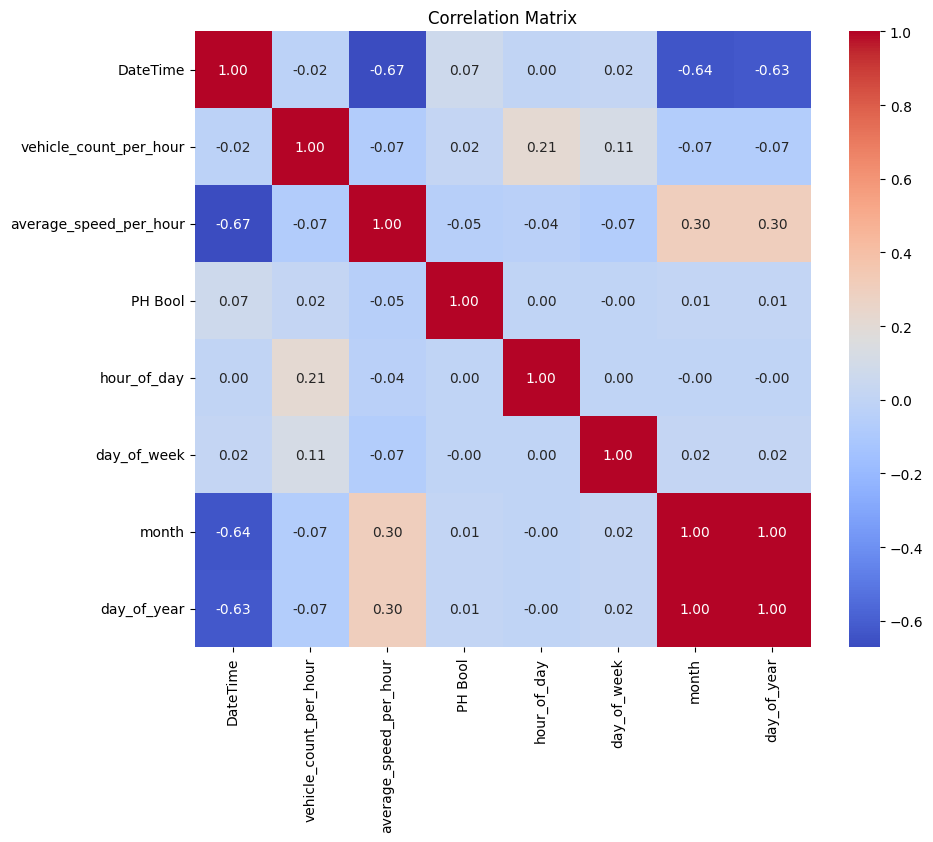

In [56]:
# Calculate the correlation matrix
corr_matrix = df.corr()

# Display the correlation matrix
print(corr_matrix)

# For a better visual understanding, you can plot the correlation matrix using seaborn
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='coolwarm', cbar=True, square=True)
plt.title("Correlation Matrix")
plt.show()

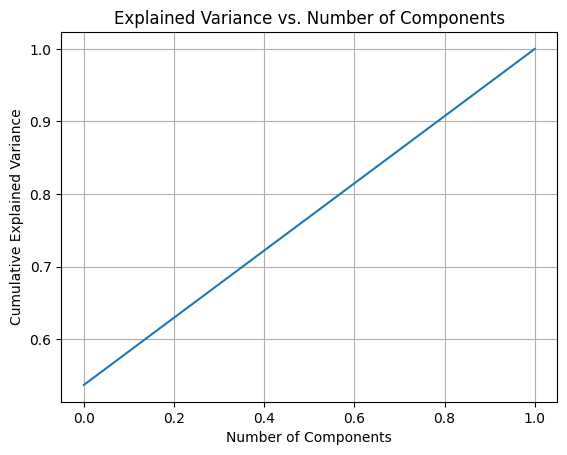

Optimal number of components to retain 90% variance: 2
   Principal Component 1  Principal Component 2
0              -0.919997              -0.330761
1              -1.298162              -0.131301
2              -1.227087              -0.276835
3              -1.126229              -0.392586
4              -1.182411              -0.232159
Explained variance by component: [0.53701544 0.46298456]


In [57]:
# Import necessary libraries
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt


# Identify numeric columns for PCA (based on domain knowledge and feature relevance)
numeric_features = ['vehicle_count_per_hour', 'average_speed_per_hour']

# Standardize the data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(df[numeric_features])

# Apply PCA without specifying number of components initially
pca = PCA()
pca.fit(scaled_data)

# Plot cumulative explained variance to determine optimal number of components
cumulative_explained_variance = np.cumsum(pca.explained_variance_ratio_)
plt.plot(cumulative_explained_variance)
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Explained Variance vs. Number of Components')
plt.grid(True)
plt.show()

# Determine the optimal number of components based on a chosen threshold (e.g., 90%)
optimal_components = np.argmax(cumulative_explained_variance >= 0.90) + 1
print(f"Optimal number of components to retain 90% variance: {optimal_components}")

# Re-run PCA with the optimal number of components
pca_optimal = PCA(n_components=optimal_components)
principal_components_optimal = pca_optimal.fit_transform(scaled_data)

# Convert to DataFrame for easier handling
pca_df_optimal = pd.DataFrame(data=principal_components_optimal, 
                              columns=[f'Principal Component {i+1}' for i in range(optimal_components)])

# Display the resulting DataFrame
print(pca_df_optimal.head())

# Optionally, examine the variance explained by each principal component
print(f"Explained variance by component: {pca_optimal.explained_variance_ratio_}")


In [58]:
# Define the threshold as a percentage of maximum variance
threshold = 0.02  # Example threshold of 1%

selector = VarianceThreshold(threshold=(threshold * (1 - threshold)))
selector.fit(df[numeric_features])

# Get the indices of the features that are being kept
features_to_keep_indices = selector.get_support(indices=True)
# Get the feature names
features_to_keep_names = df[numeric_features].columns[features_to_keep_indices]

# Print the names of the features that are kept
print("Features to keep based on threshold of variance:")
print(features_to_keep_names)

# Alternatively, print the names of the features that are removed
features_to_remove = df[numeric_features].columns[~selector.get_support()]
print("\nFeatures removed due to low variance:")
print(features_to_remove)

# Transform dataset to only include features with variance above the threshold
df_low_variance = df[features_to_keep_names]




# Calculate the correlation matrix
corr_matrix = df.corr()

# Get the correlation of all features with 'vehicle_count_per_hour'
vehicle_correlations = corr_matrix['vehicle_count_per_hour'].sort_values(ascending=False)

# Print the correlations
print("Correlation of features with 'vehicle_count_per_hour':")
print(vehicle_correlations)


Features to keep based on threshold of variance:
Index(['vehicle_count_per_hour', 'average_speed_per_hour'], dtype='object')

Features removed due to low variance:
Index([], dtype='object')
Correlation of features with 'vehicle_count_per_hour':
vehicle_count_per_hour    1.000000
hour_of_day               0.212474
day_of_week               0.113984
PH Bool                   0.015986
DateTime                 -0.020918
day_of_year              -0.067159
month                    -0.069897
average_speed_per_hour   -0.074031
Name: vehicle_count_per_hour, dtype: float64


##### chi-square test?

#### Random Forest R-squared

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LassoCV
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score

# Assuming df is your DataFrame and it's already loaded

# Identify the target variable
target = 'vehicle_count_per_hour'

# Extract features and target from the DataFrame
features = df.columns.tolist()
features.remove(target)
X = df[features]
y = df[target]

# Select only numeric features for scaling
numeric_features = X.select_dtypes(include=[float, int]).columns.tolist()
X_numeric = X[numeric_features]

# Standardize the numeric features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_numeric)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# Feature Selection using LassoCV
lasso = LassoCV(cv=5).fit(X_train, y_train)
selected_features_mask = lasso.coef_ != 0
selected_features = [numeric_features[i] for i in range(len(numeric_features)) if selected_features_mask[i]]

print(f"Selected features: {selected_features}")

# Train a Random Forest using selected features
rf = RandomForestRegressor(n_estimators=100, random_state=42)
rf.fit(X_train[:, selected_features_mask], y_train)

# Make predictions and evaluate
y_pred = rf.predict(X_test[:, selected_features_mask])
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Random Forest MSE: {mse}")
print(f"Random Forest R-squared: {r2}")

# Optionally, display the coefficients from LassoCV
lasso_coefficients = pd.DataFrame({'Feature': numeric_features, 'Coefficient': lasso.coef_})
print("\nLasso Coefficients:")
print(lasso_coefficients)



#### lasso_coefficients

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

# Coefficients from LassoCV
lasso_coefficients = pd.DataFrame({'Feature': numeric_features, 'Coefficient': lasso.coef_})

# Plotting
plt.figure(figsize=(12, 8))
plt.barh(lasso_coefficients['Feature'], lasso_coefficients['Coefficient'], color='skyblue')
plt.xlabel('Coefficient Value')
plt.ylabel('Feature')
plt.title('Feature Impact on Vehicle Count Per Hour (Lasso Coefficients)')
plt.grid(True)
plt.show()

## Phase 3 - Model Training

## Data Preperation

In [62]:
import numpy as np
import os
import datetime
import itertools
from tensorflow.keras.layers import GRU, Dense, Dropout
from tensorflow.keras.callbacks import TensorBoard, EarlyStopping
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import Sequential
from sklearn.metrics import confusion_matrix, classification_report
import matplotlib.pyplot as plt
from keras_tuner import RandomSearch, HyperParameters
from sklearn.metrics import mean_squared_error, mean_absolute_error

# Define the parameter grid for grid search
param_grid_gru = {
    'units': [32],
    'dropout_rate': [0.3, 0.2],
    'recurrent_dropout_rate': [0.3, 0.2],
    'epochs': [100, 50],
    'learning_rate': [0.01, 0.001],
    'batch_size': [32, 64],
    'activation_function': ['tanh'],
}

def train_and_evaluate_model_gru(X_train, y_train, X_test, y_test, **params):
    log_dir = os.path.join("logs_24052024", "gru", datetime.datetime.now().strftime("%Y%m%d-%H%M%S") + "_" + "_".join(f"{k}{v}" for k, v in params.items()))
    tensorboard_callback = TensorBoard(log_dir=log_dir, histogram_freq=1)
    
    model = Sequential([
        GRU(units=params['units'], activation=params['activation_function'], return_sequences=True, input_shape=(X_train.shape[1], X_train.shape[2])),
        Dropout(params['dropout_rate']),
        GRU(units=params['units'], activation=params['activation_function']),
        Dropout(params['dropout_rate']),
        Dense(1)
    ])
    model.compile(loss="mse", optimizer=Adam(learning_rate=params['learning_rate']))
    early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
    reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2, min_lr=0.0001)
    
    model.fit(X_train, y_train, epochs=params['epochs'], batch_size=params['batch_size'], validation_split=0.2, callbacks=[early_stopping, tensorboard_callback, reduce_lr])
    
    y_pred = model.predict(X_test).flatten()
    score = model.evaluate(X_test, y_test, verbose=0)
    return score, y_pred

# Initialize best score and params
best_score = float('inf')
best_params = None
best_predictions = None

# Assuming X_train, X_test, y_train, y_test are already defined and properly shaped
# Reshape data to 3D shape required by GRU: (samples, timesteps, features)
X_train_reshaped = np.expand_dims(X_train, axis=-1) if len(X_train.shape) == 2 else X_train
X_test_reshaped = np.expand_dims(X_test, axis=-1) if len(X_test.shape) == 2 else X_test

# Grid search over all combinations of parameters in the GRU grid
for combination in itertools.product(*param_grid_gru.values()):
    params = dict(zip(param_grid_gru.keys(), combination))
    print(f"Training with parameters: {params}")
    
    score, predictions = train_and_evaluate_model_gru(X_train=X_train_reshaped, y_train=y_train, X_test=X_test_reshaped, y_test=y_test, **params)

    if score < best_score:
        best_score = score
        best_params = params
        best_predictions = predictions

print(f"Best Score: {best_score}")
print(f"Best Parameters: {best_params}")

# Define thresholds for categorization based on data distribution
thresholds = np.quantile(y_train, [0.2, 0.4, 0.6, 0.8])

def categorize(values, thresholds):
    categories = np.digitize(values, bins=thresholds, right=True)
    category_labels = ['Very Low', 'Low', 'Medium', 'High', 'Very High']
    return np.array([category_labels[cat] for cat in categories])

# Categorize predictions and actual values
predicted_categories = categorize(best_predictions, thresholds)
actual_categories = categorize(y_test, thresholds)

# Generate the confusion matrix
cm = confusion_matrix(actual_categories, predicted_categories)
print('Confusion Matrix:\n', cm)
print('Classification Report:\n', classification_report(actual_categories, predicted_categories))
# Define the parameter grid for grid search
param_grid_gru = {
    'units': [32],
    'dropout_rate': [0.3, 0.2],
    'recurrent_dropout_rate': [0.3, 0.2],
    'epochs': [100, 50],
    'learning_rate': [0.01, 0.001],
    'batch_size': [32, 64],
    'activation_function': ['tanh'],
}

def train_and_evaluate_model_gru(X_train, y_train, X_test, y_test, **params):
    log_dir = os.path.join("logs_24052024", "gru", datetime.datetime.now().strftime("%Y%m%d-%H%M%S") + "_" + "_".join(f"{k}{v}" for k, v in params.items()))
    tensorboard_callback = TensorBoard(log_dir=log_dir, histogram_freq=1)
    
    model = Sequential([
        GRU(units=params['units'], activation=params['activation_function'], return_sequences=True, input_shape=(X_train.shape[1], X_train.shape[2])),
        Dropout(params['dropout_rate']),
        GRU(units=params['units'], activation=params['activation_function']),
        Dropout(params['dropout_rate']),
        Dense(1)
    ])
    model.compile(loss="mse", optimizer=Adam(learning_rate=params['learning_rate']))
    early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
    
    model.fit(X_train, y_train, epochs=params['epochs'], batch_size=params['batch_size'], validation_split=0.2, callbacks=[early_stopping, tensorboard_callback])
    
    y_pred = model.predict(X_test).flatten()
    score = model.evaluate(X_test, y_test, verbose=0)
    return score, y_pred

# Initialize best score and params
best_score = float('inf')
best_params = None
best_predictions = None

# Assuming X_train, X_test, y_train, y_test are already defined and properly shaped
# Reshape data to 3D shape required by GRU: (samples, timesteps, features)
X_train_reshaped = np.expand_dims(X_train, axis=-1) if len(X_train.shape) == 2 else X_train
X_test_reshaped = np.expand_dims(X_test, axis=-1) if len(X_test.shape) == 2 else X_test

# Grid search over all combinations of parameters in the GRU grid
for combination in itertools.product(*param_grid_gru.values()):
    params = dict(zip(param_grid_gru.keys(), combination))
    print(f"Training with parameters: {params}")
    
    score, predictions = train_and_evaluate_model_gru(X_train=X_train_reshaped, y_train=y_train, X_test=X_test_reshaped, y_test=y_test, **params)

    if score < best_score:
        best_score = score
        best_params = params
        best_predictions = predictions

print(f"Best Score: {best_score}")
print(f"Best Parameters: {best_params}")

# Define thresholds for categorization based on data distribution
thresholds = np.quantile(y_train, [0.2, 0.4, 0.6, 0.8])

def categorize(values, thresholds):
    categories = np.digitize(values, bins=thresholds, right=True)
    category_labels = ['Very Low', 'Low', 'Medium', 'High', 'Very High']
    return np.array([category_labels[cat] for cat in categories])

# Categorize predictions and actual values
predicted_categories = categorize(best_predictions, thresholds)
actual_categories = categorize(y_test, thresholds)

# Generate the confusion matrix
cm = confusion_matrix(actual_categories, predicted_categories)
print('Confusion Matrix:\n', cm)
print('Classification Report:\n', classification_report(actual_categories, predicted_categories))


Training with parameters: {'units': 32, 'dropout_rate': 0.3, 'recurrent_dropout_rate': 0.3, 'epochs': 100, 'learning_rate': 0.01, 'batch_size': 32, 'activation_function': 'tanh'}
Epoch 1/100
122/122 [==============================] - 3s 6ms/step - loss: 0.0207 - val_loss: 0.0128 - lr: 0.0100
Epoch 2/100
122/122 [==============================] - 0s 3ms/step - loss: 0.0133 - val_loss: 0.0084 - lr: 0.0100
Epoch 3/100
122/122 [==============================] - 0s 3ms/step - loss: 0.0113 - val_loss: 0.0088 - lr: 0.0100
Epoch 4/100
122/122 [==============================] - 0s 3ms/step - loss: 0.0114 - val_loss: 0.0060 - lr: 0.0100
Epoch 5/100
122/122 [==============================] - 0s 3ms/step - loss: 0.0104 - val_loss: 0.0085 - lr: 0.0100
Epoch 6/100
122/122 [==============================] - 0s 3ms/step - loss: 0.0103 - val_loss: 0.0082 - lr: 0.0100
Epoch 7/100
122/122 [==============================] - 0s 3ms/step - loss: 0.0093 - val_loss: 0.0071 - lr: 0.0050
Epoch 8/100
122/122 [==

In [63]:
from sklearn.metrics import mean_squared_error, mean_absolute_error
import numpy as np

# Calculate MAE, RMSE, and MSE
mae = mean_absolute_error(y_test, best_predictions)
mse = mean_squared_error(y_test, best_predictions)
rmse = np.sqrt(mse)

# Print the results
print(f"Mean Absolute Error (MAE): {mae}")
print(f"Mean Squared Error (MSE): {mse}")
print(f"Root Mean Squared Error (RMSE): {rmse}")


Mean Absolute Error (MAE): 0.05564424769888638
Mean Squared Error (MSE): 0.00557399044276158
Root Mean Squared Error (RMSE): 0.07465916181395006


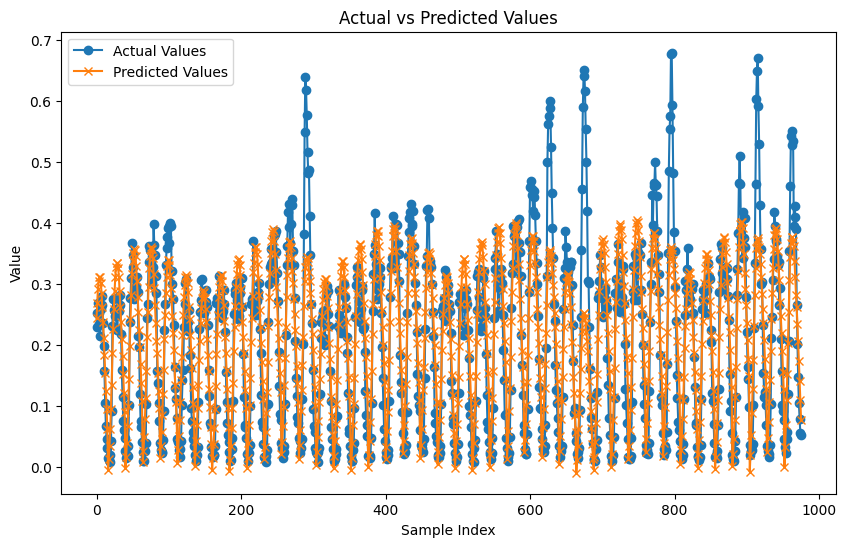

In [64]:
import matplotlib.pyplot as plt

# Plot the actual vs predicted values
plt.figure(figsize=(10, 6))
plt.plot(range(len(y_test)), y_test, label='Actual Values', marker='o')
plt.plot(range(len(best_predictions)), best_predictions, label='Predicted Values', marker='x')
plt.title('Actual vs Predicted Values')
plt.xlabel('Sample Index')
plt.ylabel('Value')
plt.legend()
plt.show()


### LSTM

Training with parameters: {'units': 50, 'dense_units': 50, 'epochs': 25, 'learning_rate': 0.001, 'batch_size': 16, 'activation_function': 'relu'}
Epoch 1/25
244/244 [==============================] - 1s 2ms/step - loss: 0.0210 - val_loss: 0.0181 - lr: 0.0010
Epoch 2/25
244/244 [==============================] - 0s 2ms/step - loss: 0.0161 - val_loss: 0.0169 - lr: 0.0010
Epoch 3/25
244/244 [==============================] - 0s 2ms/step - loss: 0.0142 - val_loss: 0.0109 - lr: 0.0010
Epoch 4/25
244/244 [==============================] - 0s 2ms/step - loss: 0.0129 - val_loss: 0.0107 - lr: 0.0010
Epoch 5/25
244/244 [==============================] - 0s 2ms/step - loss: 0.0118 - val_loss: 0.0103 - lr: 0.0010
Epoch 6/25
244/244 [==============================] - 0s 2ms/step - loss: 0.0112 - val_loss: 0.0089 - lr: 0.0010
Epoch 7/25
244/244 [==============================] - 0s 2ms/step - loss: 0.0106 - val_loss: 0.0089 - lr: 0.0010
Epoch 8/25
244/244 [==============================] - 0s 2ms/st

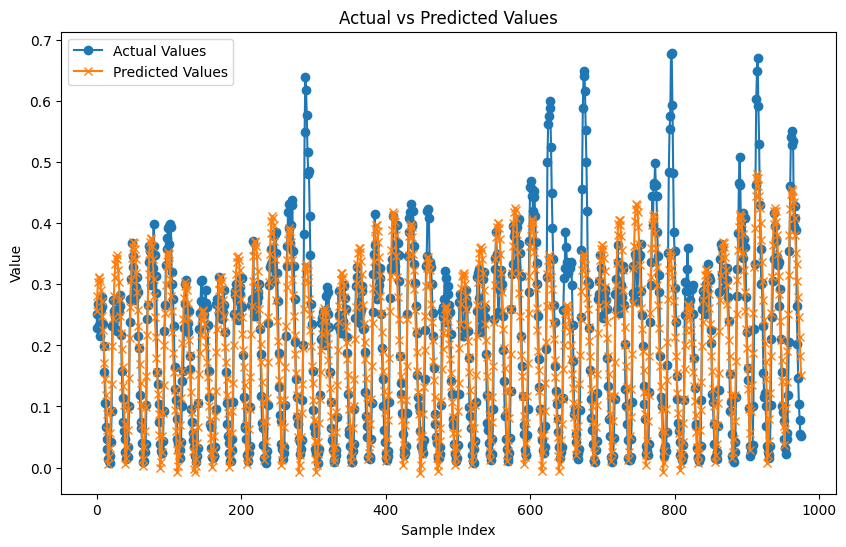

In [70]:
import numpy as np
import os
import datetime
import itertools
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.callbacks import TensorBoard, EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import Sequential
from sklearn.metrics import confusion_matrix, classification_report
import matplotlib.pyplot as plt
from keras_tuner import RandomSearch, HyperParameters
from sklearn.metrics import mean_squared_error, mean_absolute_error

# Define the parameter grid for grid search
param_grid_lstm = {
    'units': [50, 100, 150],
    'dense_units': [50, 100],
    'epochs': [25, 50],
    'learning_rate': [0.001, 0.01],
    'batch_size': [16, 32, 64],
    'activation_function': ['relu', 'tanh']
}

def train_and_evaluate_model_lstm(X_train, y_train, X_test, y_test, **params):
    log_dir = os.path.join("logs_24052024", "lstm", datetime.datetime.now().strftime("%Y%m%d-%H%M%S") + "_" + "_".join(f"{k}{v}" for k, v in params.items()))
    tensorboard_callback = TensorBoard(log_dir=log_dir, histogram_freq=1)
    
    model = Sequential([
        LSTM(units=params['units'], activation=params['activation_function'], input_shape=(X_train.shape[1], X_train.shape[2])),
        Dense(params['dense_units'], activation=params['activation_function']),
        Dropout(0.5),
        Dense(1)
    ])
    model.compile(loss="mse", optimizer=Adam(learning_rate=params['learning_rate']))
    early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
    reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2, min_lr=0.0001)
    
    model.fit(X_train, y_train, epochs=params['epochs'], batch_size=params['batch_size'], validation_split=0.2, callbacks=[early_stopping, tensorboard_callback, reduce_lr])
    
    y_pred = model.predict(X_test).flatten()
    score = model.evaluate(X_test, y_test, verbose=0)
    return score, y_pred

# Initialize best score and params
best_score = float('inf')
best_params = None
best_predictions = None

# Assuming X_train, X_test, y_train, y_test are already defined and properly shaped
# Reshape data to 3D shape required by LSTM: (samples, timesteps, features)
X_train_reshaped = np.expand_dims(X_train, axis=-1) if len(X_train.shape) == 2 else X_train
X_test_reshaped = np.expand_dims(X_test, axis=-1) if len(X_test.shape) == 2 else X_test

# Grid search over all combinations of parameters in the LSTM grid
for combination in itertools.product(*param_grid_lstm.values()):
    params = dict(zip(param_grid_lstm.keys(), combination))
    print(f"Training with parameters: {params}")
    
    try:
        score, predictions = train_and_evaluate_model_lstm(X_train=X_train_reshaped, y_train=y_train, X_test=X_test_reshaped, y_test=y_test, **params)

        if score < best_score:
            best_score = score
            best_params = params
            best_predictions = predictions
    except Exception as e:
        print(f"Error occurred with parameters {params}: {e}")

print(f"Best Score: {best_score}")
print(f"Best Parameters: {best_params}")

# Define thresholds for categorization based on data distribution
thresholds = np.quantile(y_train, [0.2, 0.4, 0.6, 0.8])

def categorize(values, thresholds):
    categories = np.digitize(values, bins=thresholds, right=True)
    category_labels = ['Very Low', 'Low', 'Medium', 'High', 'Very High']
    return np.array([category_labels[cat] for cat in categories])

# Categorize predictions and actual values
predicted_categories = categorize(best_predictions, thresholds)
actual_categories = categorize(y_test, thresholds)

# Generate the confusion matrix
cm = confusion_matrix(actual_categories, predicted_categories)
print('Confusion Matrix:\n', cm)
print('Classification Report:\n', classification_report(actual_categories, predicted_categories))

# Calculate and print MAE, RMSE, and MSE
mae = mean_absolute_error(y_test, best_predictions)
mse = mean_squared_error(y_test, best_predictions)
rmse = np.sqrt(mse)

print(f"Mean Absolute Error (MAE): {mae}")
print(f"Mean Squared Error (MSE): {mse}")
print(f"Root Mean Squared Error (RMSE): {rmse}")

# Plot the actual vs predicted values
plt.figure(figsize=(10, 6))
plt.plot(range(len(y_test)), y_test, label='Actual Values', marker='o')
plt.plot(range(len(best_predictions)), best_predictions, label='Predicted Values', marker='x')
plt.title('Actual vs Predicted Values')
plt.xlabel('Sample Index')
plt.ylabel('Value')
plt.legend()
plt.show()


### 1D CNN

In [ ]:
# Define thresholds for categorization based on data distribution
thresholds = np.quantile(y_train, [0.2, 0.4, 0.6, 0.8])

def categorize(values, thresholds):
    categories = np.digitize(values, bins=thresholds, right=True)
    category_labels = ['Very Low', 'Low', 'Medium', 'High', 'Very High']
    return np.array([category_labels[cat] for cat in categories])

# Categorize predictions and actual values
predicted_categories = categorize(best_predictions, thresholds)
actual_categories = categorize(y_test, thresholds)

# Generate the confusion matrix
cm = confusion_matrix(actual_categories, predicted_categories)
print('Confusion Matrix:\n', cm)
print('Classification Report:\n', classification_report(actual_categories, predicted_categories))


Training with parameters: {'filters': 16, 'kernel_size': 3, 'dense_units': 50, 'epochs': 25, 'learning_rate': 0.001, 'batch_size': 16, 'activation_function': 'relu'}
Epoch 1/25
244/244 [==============================] - 1s 1ms/step - loss: 0.0215 - val_loss: 0.0109 - lr: 0.0010
Epoch 2/25
244/244 [==============================] - 0s 1ms/step - loss: 0.0135 - val_loss: 0.0090 - lr: 0.0010
Epoch 3/25
244/244 [==============================] - 0s 1ms/step - loss: 0.0118 - val_loss: 0.0070 - lr: 0.0010
Epoch 4/25
244/244 [==============================] - 0s 1ms/step - loss: 0.0110 - val_loss: 0.0086 - lr: 0.0010
Epoch 5/25
244/244 [==============================] - 0s 1ms/step - loss: 0.0105 - val_loss: 0.0074 - lr: 0.0010
Epoch 6/25
244/244 [==============================] - 0s 1ms/step - loss: 0.0099 - val_loss: 0.0067 - lr: 5.0000e-04
Epoch 7/25
244/244 [==============================] - 0s 1ms/step - loss: 0.0099 - val_loss: 0.0062 - lr: 5.0000e-04
Epoch 8/25
244/244 [===============

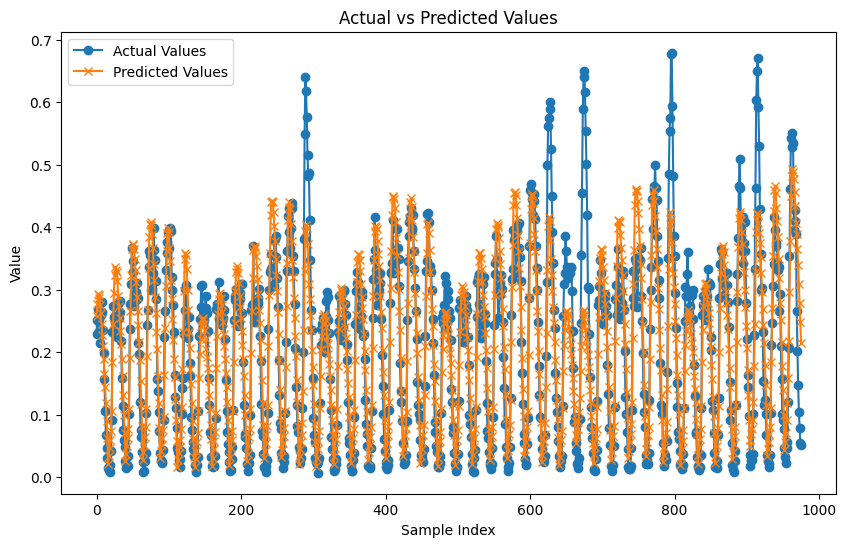

In [68]:
import numpy as np
import os
import datetime
import itertools
from tensorflow.keras.layers import Conv1D, Dense, Dropout, Flatten
from tensorflow.keras.callbacks import TensorBoard, EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import Sequential
from sklearn.metrics import confusion_matrix, classification_report
import matplotlib.pyplot as plt
from keras_tuner import RandomSearch, HyperParameters
from sklearn.metrics import mean_squared_error, mean_absolute_error

# Define the parameter grid for grid search
param_grid_cnn = {
    'filters': [16, 32, 64],
    'kernel_size': [3, 5, 7],
    'dense_units': [50, 100],
    'epochs': [25, 50],
    'learning_rate': [0.001, 0.01],
    'batch_size': [16, 32, 64],
    'activation_function': ['relu', 'tanh']
}

def train_and_evaluate_model_cnn(X_train, y_train, X_test, y_test, **params):
    log_dir = os.path.join("logs_24052024", "cnn", datetime.datetime.now().strftime("%Y%m%d-%H%M%S") + "_" + "_".join(f"{k}{v}" for k, v in params.items()))
    tensorboard_callback = TensorBoard(log_dir=log_dir, histogram_freq=1)
    
    model = Sequential([
        Conv1D(filters=params['filters'], kernel_size=params['kernel_size'], activation=params['activation_function'], input_shape=(X_train.shape[1], X_train.shape[2])),
        Flatten(),
        Dense(params['dense_units'], activation=params['activation_function']),
        Dropout(0.5),
        Dense(1)
    ])
    model.compile(loss="mse", optimizer=Adam(learning_rate=params['learning_rate']))
    early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
    reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2, min_lr=0.0001)
    
    model.fit(X_train, y_train, epochs=params['epochs'], batch_size=params['batch_size'], validation_split=0.2, callbacks=[early_stopping, tensorboard_callback, reduce_lr])
    
    y_pred = model.predict(X_test).flatten()
    score = model.evaluate(X_test, y_test, verbose=0)
    return score, y_pred

# Initialize best score and params
best_score = float('inf')
best_params = None
best_predictions = None

# Assuming X_train, X_test, y_train, y_test are already defined and properly shaped
# Reshape data to 3D shape required by 1D CNN: (samples, timesteps, features)
X_train_reshaped = np.expand_dims(X_train, axis=-1) if len(X_train.shape) == 2 else X_train
X_test_reshaped = np.expand_dims(X_test, axis=-1) if len(X_test.shape) == 2 else X_test

# Grid search over all combinations of parameters in the 1D CNN grid
for combination in itertools.product(*param_grid_cnn.values()):
    params = dict(zip(param_grid_cnn.keys(), combination))
    print(f"Training with parameters: {params}")
    
    try:
        score, predictions = train_and_evaluate_model_cnn(X_train=X_train_reshaped, y_train=y_train, X_test=X_test_reshaped, y_test=y_test, **params)

        if score < best_score:
            best_score = score
            best_params = params
            best_predictions = predictions
    except Exception as e:
        print(f"Error occurred with parameters {params}: {e}")

print(f"Best Score: {best_score}")
print(f"Best Parameters: {best_params}")

# Define thresholds for categorization based on data distribution
thresholds = np.quantile(y_train, [0.2, 0.4, 0.6, 0.8])

def categorize(values, thresholds):
    categories = np.digitize(values, bins=thresholds, right=True)
    category_labels = ['Very Low', 'Low', 'Medium', 'High', 'Very High']
    return np.array([category_labels[cat] for cat in categories])

# Categorize predictions and actual values
predicted_categories = categorize(best_predictions, thresholds)
actual_categories = categorize(y_test, thresholds)

# Generate the confusion matrix
cm = confusion_matrix(actual_categories, predicted_categories)
print('Confusion Matrix:\n', cm)
print('Classification Report:\n', classification_report(actual_categories, predicted_categories))

# Calculate and print MAE, RMSE, and MSE
mae = mean_absolute_error(y_test, best_predictions)
mse = mean_squared_error(y_test, best_predictions)
rmse = np.sqrt(mse)

print(f"Mean Absolute Error (MAE): {mae}")
print(f"Mean Squared Error (MSE): {mse}")
print(f"Root Mean Squared Error (RMSE): {rmse}")

# Plot the actual vs predicted values
plt.figure(figsize=(10, 6))
plt.plot(range(len(y_test)), y_test, label='Actual Values', marker='o')
plt.plot(range(len(best_predictions)), best_predictions, label='Predicted Values', marker='x')
plt.title('Actual vs Predicted Values')
plt.xlabel('Sample Index')
plt.ylabel('Value')
plt.legend()
plt.show()


In [69]:
# Define thresholds for categorization based on data distribution
thresholds = np.quantile(y_train, [0.2, 0.4, 0.6, 0.8])

def categorize(values, thresholds):
    categories = np.digitize(values, bins=thresholds, right=True)
    category_labels = ['Very Low', 'Low', 'Medium', 'High', 'Very High']
    return np.array([category_labels[cat] for cat in categories])

# Categorize predictions and actual values
predicted_categories = categorize(best_predictions, thresholds)
actual_categories = categorize(y_test, thresholds)

# Generate the confusion matrix
cm = confusion_matrix(actual_categories, predicted_categories)
print('Confusion Matrix:\n', cm)
print('Classification Report:\n', classification_report(actual_categories, predicted_categories))


Confusion Matrix:
 [[123   0  45  70   0]
 [  3  51  64   1   5]
 [ 18   2  76   2   0]
 [ 80   0   5 212   0]
 [  0 127   0   0  92]]
Classification Report:
               precision    recall  f1-score   support

        High       0.55      0.52      0.53       238
         Low       0.28      0.41      0.34       124
      Medium       0.40      0.78      0.53        98
   Very High       0.74      0.71      0.73       297
    Very Low       0.95      0.42      0.58       219

    accuracy                           0.57       976
   macro avg       0.58      0.57      0.54       976
weighted avg       0.65      0.57      0.58       976



### Model Selection

## Phase 4 - Model Testing and Evaluation

### Model Evaluation - Per Week Per Hour Patterns

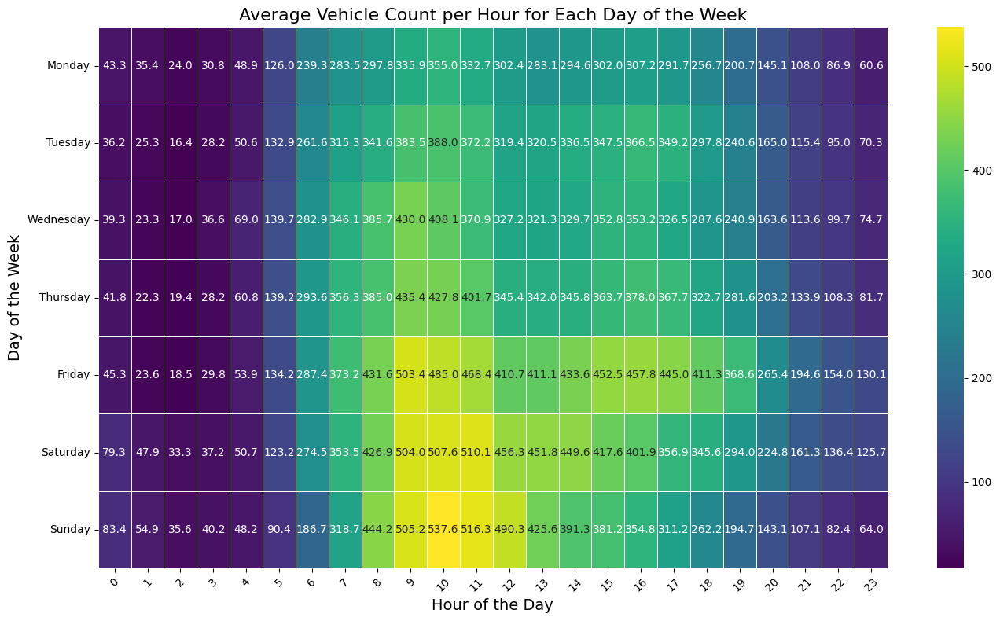

In [116]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the data
file_path = '3_WOEF_Data.csv'  # Update the path accordingly
data = pd.read_csv(file_path)

# Convert 'DateTime' to datetime format
data['DateTime'] = pd.to_datetime(data['DateTime'], format='%d/%m/%Y %H:%M')

# Extract the day of the week and hour of the day
data['DayOfWeek'] = data['DateTime'].dt.day_name()
data['HourOfDay'] = data['DateTime'].dt.hour

# Group by day of the week and hour of the day
grouped_data = data.groupby(['DayOfWeek', 'HourOfDay'])['vehicle_count_per_hour'].mean().unstack()

# Reorder the days of the week
ordered_days = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
grouped_data = grouped_data.reindex(ordered_days)

# Set up the figure and axis
plt.figure(figsize=(14, 8))

# Create a heatmap for the grouped data
sns.heatmap(grouped_data, cmap='viridis', annot=True, fmt=".1f", linewidths=.5)

# Set the labels and title
plt.title('Average Vehicle Count per Hour for Each Day of the Week', fontsize=16)
plt.xlabel('Hour of the Day', fontsize=14)
plt.ylabel('Day of the Week', fontsize=14)
plt.xticks(rotation=45)
plt.yticks(rotation=0)

# Display the heatmap
plt.tight_layout()
plt.show()
